**WEEK-2**

**Data Preprocessing and Validation**

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import os

# Example paths (update as per your folder structure)
image_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017/original_images'
mask_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017/train_masks'

# List of image and mask files
image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))

print(f"Total images: {len(image_files)}, Total masks: {len(mask_files)}")


Total images: 157, Total masks: 157


In [3]:
import cv2
import numpy as np

# Fixed size
IMG_HEIGHT = 256
IMG_WIDTH = 256

# Function to resize image and mask
def resize_image_mask(image_path, mask_path):
    image = cv2.imread(image_path)  # Read image
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read mask as grayscale

    # Resize
    image_resized = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_AREA)
    mask_resized = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)

    return image_resized, mask_resized

# Example check
img, msk = resize_image_mask(os.path.join(image_dir, image_files[0]),
                             os.path.join(mask_dir, mask_files[0]))

print(f"Image shape: {img.shape}, Mask shape: {msk.shape}")


Image shape: (256, 256, 3), Mask shape: (256, 256)


In [4]:
def normalize_image(image):
    # Convert to float and normalize to [0,1]
    return image / 255.0

# Example
img_norm = normalize_image(img)
print(f"Normalized image range: {img_norm.min()} - {img_norm.max()}")


Normalized image range: 0.0 - 0.9294117647058824


In [5]:
import random

def augment_image_mask(image, mask):
    # Horizontal flip
    if random.random() > 0.5:
        image = cv2.flip(image, 1)
        mask = cv2.flip(mask, 1)

    # Vertical flip
    if random.random() > 0.5:
        image = cv2.flip(image, 0)
        mask = cv2.flip(mask, 0)

    # Rotation (90, 180, 270)
    angle = random.choice([0, 90, 180, 270])
    if angle != 0:
        # Get rotation matrix
        M = cv2.getRotationMatrix2D((IMG_WIDTH/2, IMG_HEIGHT/2), angle, 1)
        image = cv2.warpAffine(image, M, (IMG_WIDTH, IMG_HEIGHT))
        mask = cv2.warpAffine(mask, M, (IMG_WIDTH, IMG_HEIGHT), flags=cv2.INTER_NEAREST)

    return image, mask

# Test augmentation
aug_img, aug_mask = augment_image_mask(img, msk)


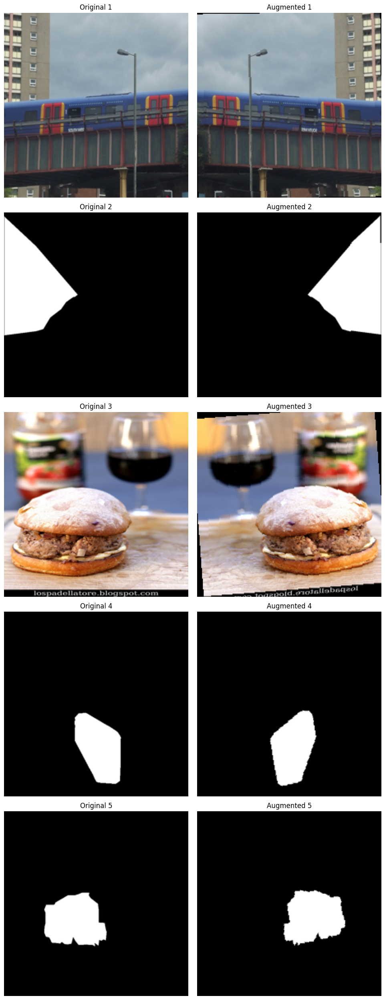

In [42]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import random

# ---------------- Paths ----------------
base_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017'
categories = ['original_images', 'train_masks', 'val2017']  # example categories

# ---------------- Target size ----------------
target_size = (224, 224)  # resize all images

# ---------------- Define augmentation ----------------
augment_transform = transforms.Compose([
    transforms.Resize(target_size),                  # resize first
    transforms.RandomHorizontalFlip(p=1.0),         # flip
    transforms.RandomRotation(30, fill=(0,0,0))    # rotate
])

# ---------------- Pick 5 random images from different categories ----------------
sample_images = []
for cat in categories:
    cat_dir = os.path.join(base_dir, cat)
    if os.path.exists(cat_dir):
        imgs = [f for f in os.listdir(cat_dir) if f.endswith(('.png','.jpg','.jpeg'))]
        if imgs:
            sample_images.append(os.path.join(cat_dir, random.choice(imgs)))

# If less than 5 images, pick more from existing
while len(sample_images) < 5:
    cat = random.choice(categories)
    cat_dir = os.path.join(base_dir, cat)
    imgs = [f for f in os.listdir(cat_dir) if f.endswith(('.png','.jpg','.jpeg'))]
    sample_images.append(os.path.join(cat_dir, random.choice(imgs)))

# ---------------- Loop through and visualize ----------------
plt.figure(figsize=(10, 25))  # taller figure

for i, img_path in enumerate(sample_images[:5]):
    # Load original image and resize
    image = Image.open(img_path).convert('RGB')
    image = image.resize(target_size)

    # Apply augmentation
    augmented_image = augment_transform(image)

    # Display original image
    plt.subplot(5, 2, 2*i + 1)
    plt.imshow(image)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    # Display augmented image
    plt.subplot(5, 2, 2*i + 2)
    plt.imshow(augmented_image)
    plt.title(f"Augmented {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


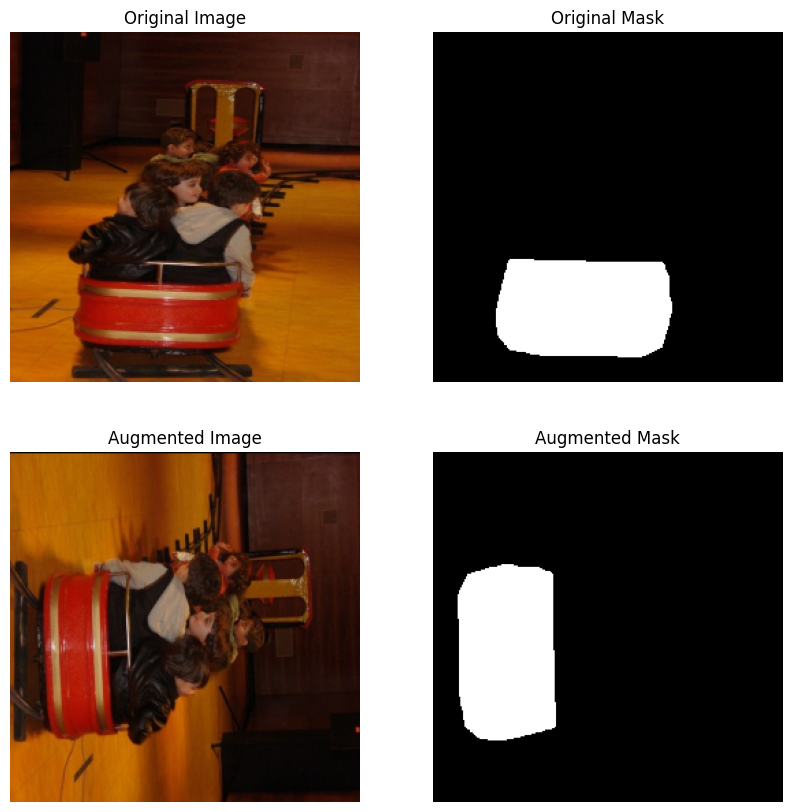

In [41]:
import matplotlib.pyplot as plt

def visualize(original_img, original_mask, augmented_img, augmented_mask):
    fig, axes = plt.subplots(2, 2, figsize=(10,10))

    axes[0,0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    axes[0,0].set_title('Original Image')
    axes[0,0].axis('off')

    axes[0,1].imshow(original_mask, cmap='gray')
    axes[0,1].set_title('Original Mask')
    axes[0,1].axis('off')

    axes[1,0].imshow(cv2.cvtColor(augmented_img, cv2.COLOR_BGR2RGB))
    axes[1,0].set_title('Augmented Image')
    axes[1,0].axis('off')

    axes[1,1].imshow(augmented_mask, cmap='gray')
    axes[1,1].set_title('Augmented Mask')
    axes[1,1].axis('off')

    plt.show()

visualize(img, msk, aug_img, aug_mask)


In [ ]:
image_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017/combined_images'
mask_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017/train_masks'

print("Total images:", len(os.listdir(image_dir)))
print("Total masks:", len(os.listdir(mask_dir)))


**Original vs Flipped**

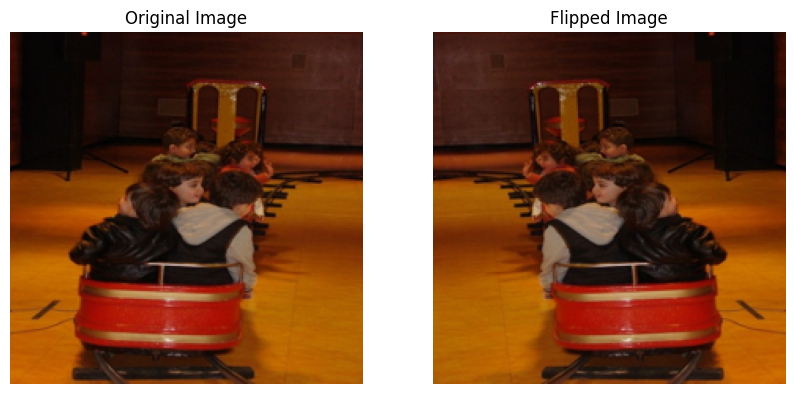

In [40]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

# ---------------- Paths ----------------
image_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017/original_images'
target_size = (224, 224)

# ---------------- Pick one sample ----------------
img_name = sorted(os.listdir(image_dir))[0]  # first image
image = Image.open(os.path.join(image_dir, img_name)).convert('RGB')
image = image.resize(target_size)  # resize original

# ---------------- Flip augmentation ----------------
flip_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=1.0)  # always flip
])
flipped_image = flip_transform(image)

# ---------------- Visualization ----------------
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(flipped_image)
plt.title("Flipped Image")
plt.axis('off')

plt.show()


**Original vs Rotated**

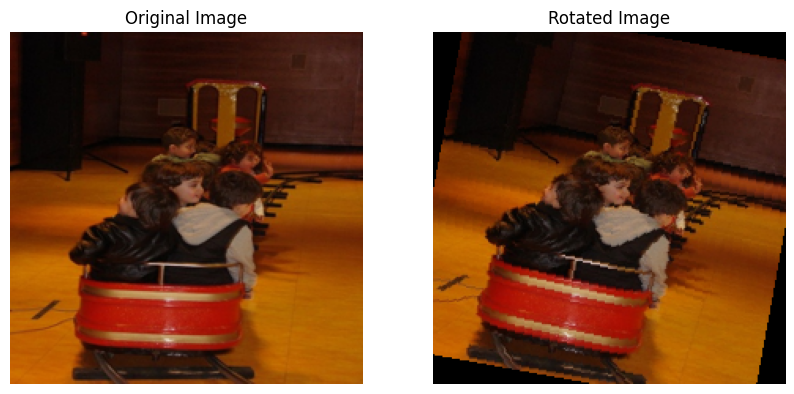

In [35]:
# ---------------- Rotation augmentation ----------------
rotate_transform = transforms.Compose([
    transforms.RandomRotation(30, fill=(0,0,0))  # rotate
])
rotated_image = rotate_transform(image)

# ---------------- Visualization ----------------
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(rotated_image)
plt.title("Rotated Image")
plt.axis('off')

plt.show()


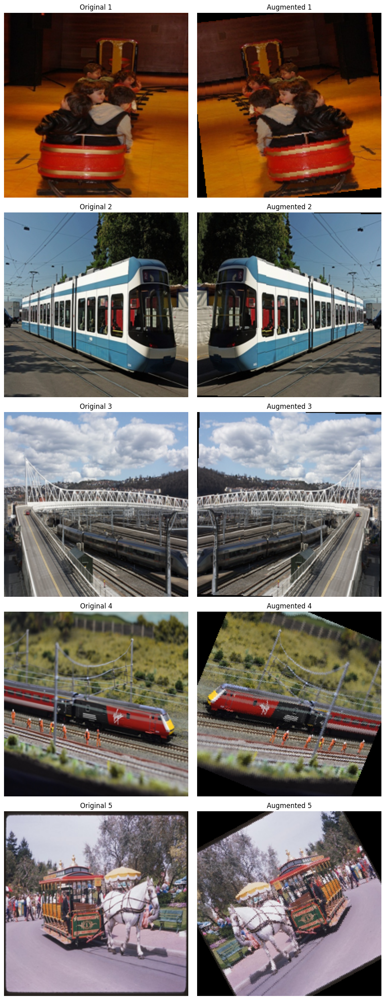

In [32]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

# ---------------- Paths ----------------
image_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017/original_images'

# ---------------- Get first 5 images ----------------
image_names = sorted(os.listdir(image_dir))[:5]  # first 5 images

# ---------------- Target size ----------------
target_size = (224, 224)  # all images resized to 224x224

# ---------------- Define augmentation ----------------
augment_transform = transforms.Compose([
    transforms.Resize(target_size),                 # resize before augmentation
    transforms.RandomHorizontalFlip(p=1.0),        # flip
    transforms.RandomRotation(30, fill=(0,0,0))    # rotate
])

# ---------------- Loop through images ----------------
plt.figure(figsize=(10, 25))  # taller figure for 5 examples

for i, img_name in enumerate(image_names):
    # Load original image and resize
    image = Image.open(os.path.join(image_dir, img_name)).convert('RGB')
    image = image.resize(target_size)  # resize original image

    # Apply augmentation
    augmented_image = augment_transform(image)

    # Display original image
    plt.subplot(5, 2, 2*i + 1)
    plt.imshow(image)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    # Display augmented image
    plt.subplot(5, 2, 2*i + 2)
    plt.imshow(augmented_image)
    plt.title(f"Augmented {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


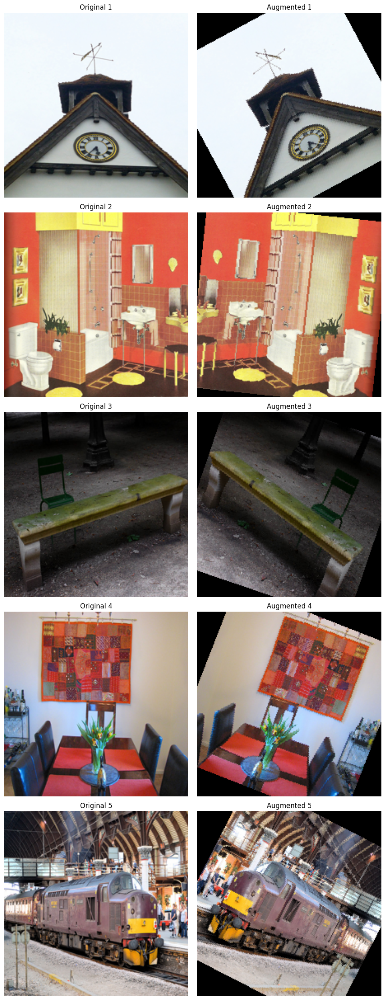

In [39]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

# ---------------- Paths ----------------
base_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017'
categories = ['original_images', 'train_masks', 'val2017']  # example folders

# ---------------- Target size ----------------
target_size = (224, 224)

# ---------------- Get 5 random images from different categories ----------------
all_images = []

for cat in categories:
    cat_dir = os.path.join(base_dir, cat)
    if os.path.exists(cat_dir):
        imgs = [os.path.join(cat_dir, f) for f in os.listdir(cat_dir) if f.endswith(('.png','.jpg','.jpeg'))]
        all_images.extend(imgs)

# Pick 5 random images
image_names = random.sample(all_images, 5)

# ---------------- Define augmentation ----------------
augment_transform = transforms.Compose([
    transforms.Resize(target_size),
    transforms.RandomHorizontalFlip(p=1.0),
    transforms.RandomRotation(30, fill=(0,0,0))
])

# ---------------- Loop through images ----------------
plt.figure(figsize=(10, 25))

for i, img_path in enumerate(image_names):
    # Load original image and resize
    image = Image.open(img_path).convert('RGB')
    image = image.resize(target_size)

    # Apply augmentation
    augmented_image = augment_transform(image)

    # Display original image
    plt.subplot(5, 2, 2*i + 1)
    plt.imshow(image)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    # Display augmented image
    plt.subplot(5, 2, 2*i + 2)
    plt.imshow(augmented_image)
    plt.title(f"Augmented {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


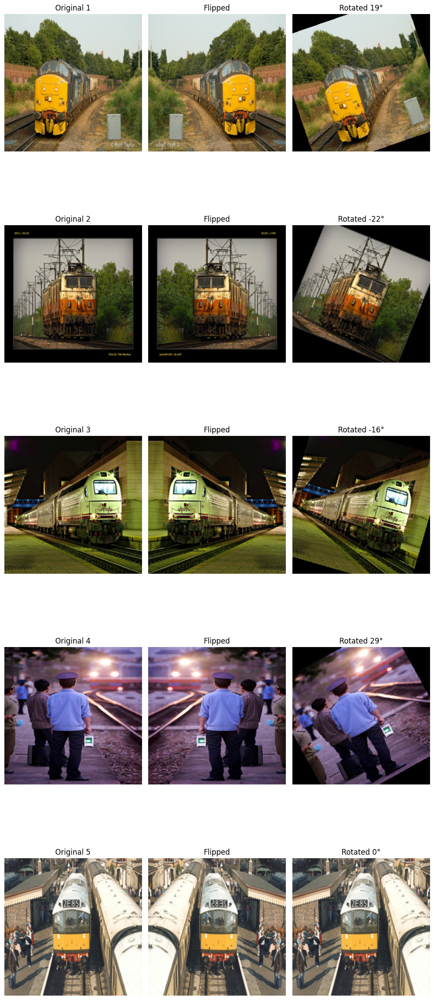

In [38]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

# ---------------- Paths ----------------
image_dir = '/content/drive/MyDrive/VisionExtract/data/coco2017/original_images'

# ---------------- Get 5 random images ----------------
all_images = [f for f in os.listdir(image_dir) if f.endswith(('.png','.jpg','.jpeg'))]
image_names = random.sample(all_images, 5)  # pick 5 random images

# ---------------- Target size ----------------
target_size = (224, 224)

# ---------------- Loop through images ----------------
plt.figure(figsize=(10, 25))

for i, img_name in enumerate(image_names):
    # Load original image and resize
    image = Image.open(os.path.join(image_dir, img_name)).convert('RGB')
    image = image.resize(target_size)

    # ---------------- Apply different augmentations ----------------
    # Flip
    flip_transform = transforms.RandomHorizontalFlip(p=1.0)
    flipped_image = flip_transform(image)

    # Rotate with random angle between -30 to 30
    angle = random.randint(-30, 30)
    rotated_image = image.rotate(angle, fillcolor=(0,0,0))

    # Display original
    plt.subplot(5, 3, 3*i + 1)
    plt.imshow(image)
    plt.title(f"Original {i+1}")
    plt.axis('off')

    # Display flipped
    plt.subplot(5, 3, 3*i + 2)
    plt.imshow(flipped_image)
    plt.title("Flipped")
    plt.axis('off')

    # Display rotated
    plt.subplot(5, 3, 3*i + 3)
    plt.imshow(rotated_image)
    plt.title(f"Rotated {angle}°")
    plt.axis('off')

plt.tight_layout()
plt.show()


**Subject - Trains Binary Mask Images**

loading annotations into memory...
Done (t=0.60s)
creating index...
index created!
Total 'train' images in annotations: 157
Showing 3 sample images with masks...



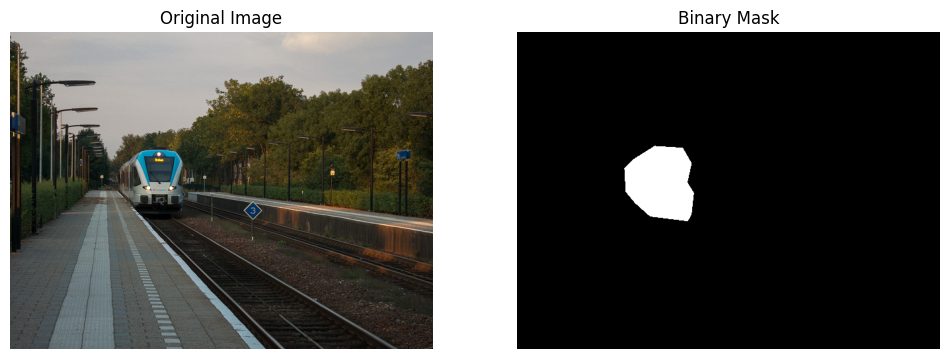

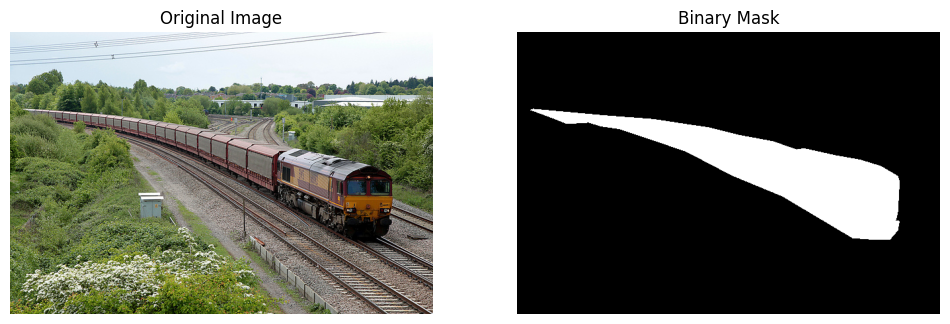

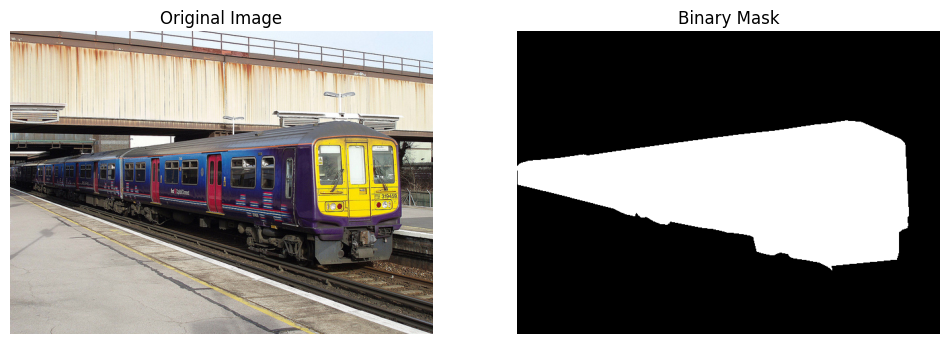


✅ Saved and visualized 3 masks in: /content/drive/MyDrive/VisionExtract/data/coco2017/train_masks


In [37]:
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

# ------------------ Paths ------------------
dataDir = '/content/drive/MyDrive/VisionExtract/data/coco2017'
imgDir = os.path.join(dataDir, 'val2017')
annFile = '/content/drive/MyDrive/VisionExtract/data/annotations/instances_val2017.json'

output_mask_dir = os.path.join(dataDir, 'train_masks')
os.makedirs(output_mask_dir, exist_ok=True)

# ------------------ Initialize COCO ------------------
coco = COCO(annFile)

# ------------------ Category ------------------
catId = 7  # Train category
imgIds = coco.getImgIds(catIds=[catId])
print(f"Total 'train' images in annotations: {len(imgIds)}")

# ------------------ Loop through only first 10 images ------------------
num_samples = 3
print(f"Showing {num_samples} sample images with masks...\n")

for count, imgId in enumerate(imgIds[:num_samples]):   # <--- simpler slicing
    img_info = coco.loadImgs(imgId)[0]
    img_path = os.path.join(imgDir, img_info['file_name'])

    if not os.path.exists(img_path):
        print(f"Skipping missing image: {img_info['file_name']}")
        continue

    # Read original image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width = img_info['height'], img_info['width']

    # Create empty mask
    mask = np.zeros((height, width), dtype=np.uint8)

    # Get annotations for this image
    annIds = coco.getAnnIds(imgIds=imgId, catIds=[catId], iscrowd=None)
    anns = coco.loadAnns(annIds)

    for ann in anns:
        rle = coco.annToRLE(ann)
        m = maskUtils.decode(rle)
        mask = np.maximum(mask, m)

    # Save binary mask
    mask_filename = os.path.join(output_mask_dir, f"{img_info['file_name'].split('.')[0]}_mask.png")
    cv2.imwrite(mask_filename, mask*255)

    # ---- Plot side by side ----
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title("Binary Mask")
    axes[1].axis("off")

    plt.show()

print(f"\n✅ Saved and visualized {num_samples} masks in: {output_mask_dir}")


loading annotations into memory...
Done (t=1.66s)
creating index...
index created!
Total 'train' images in annotations: 157
Showing 10 sample images with masks...



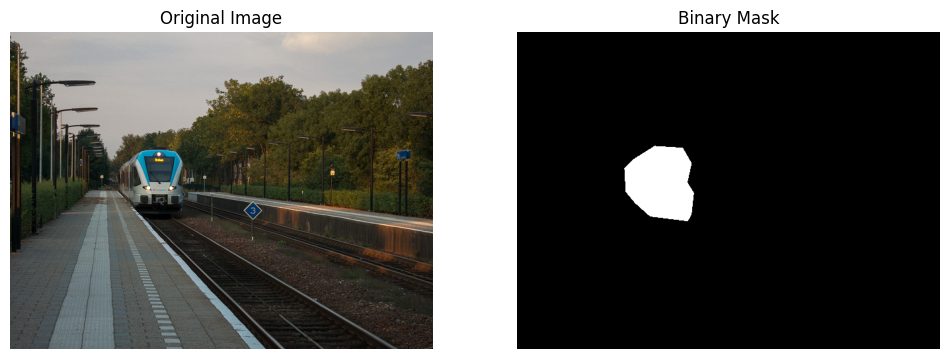

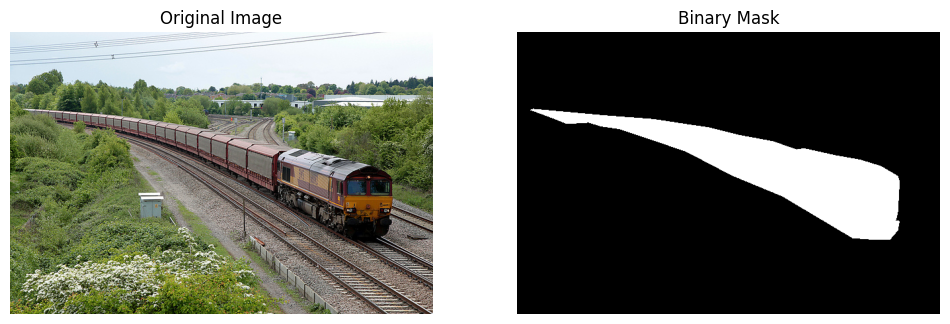

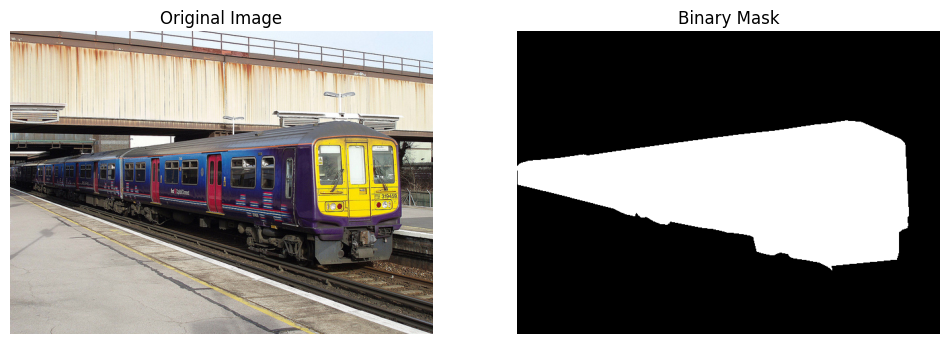

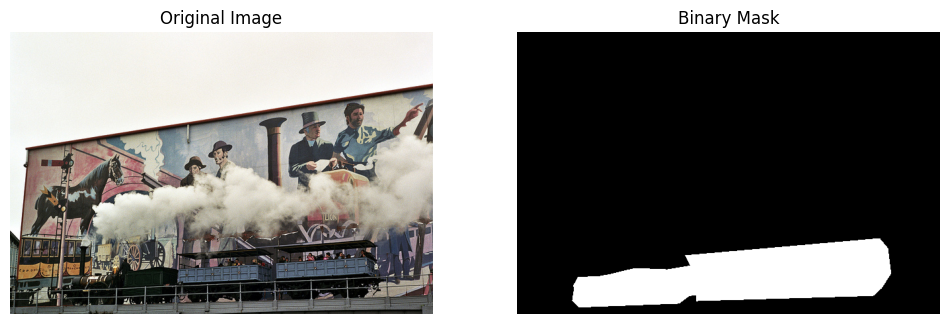

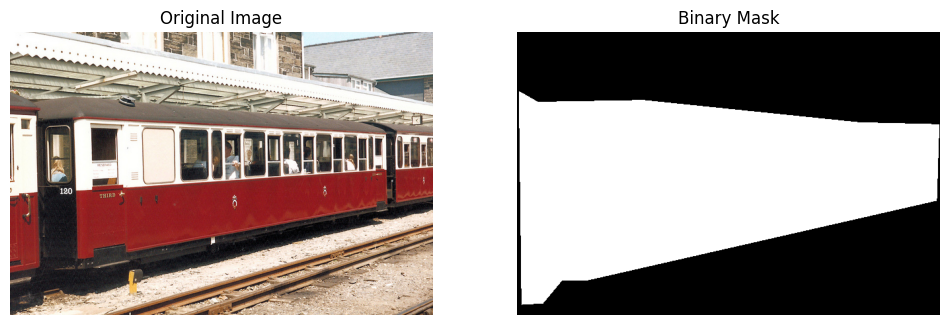

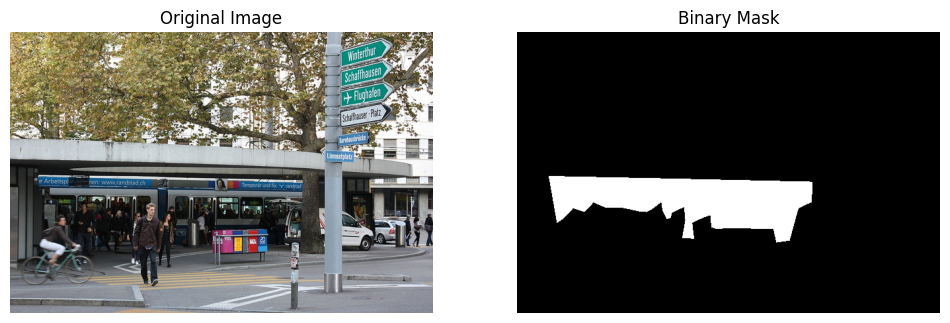

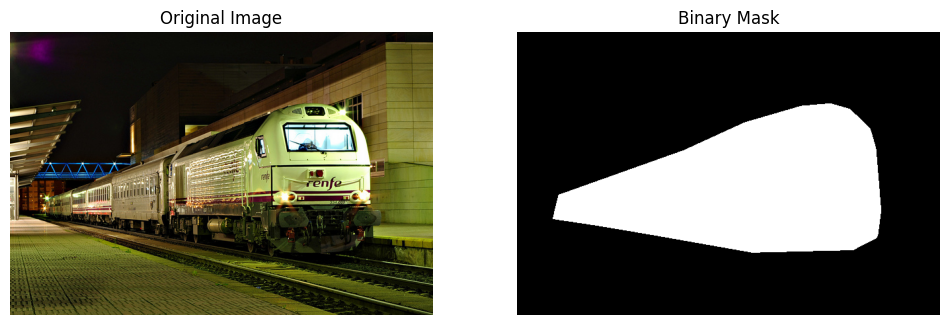

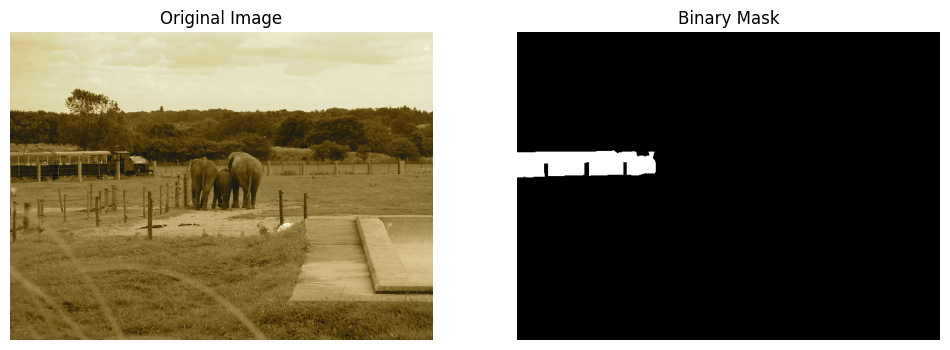

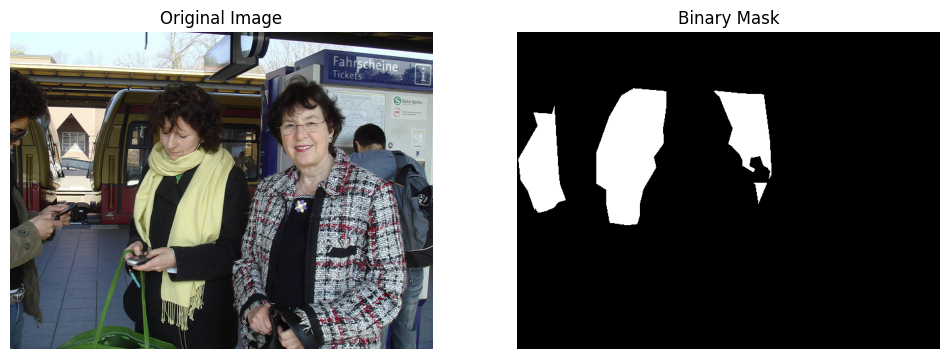

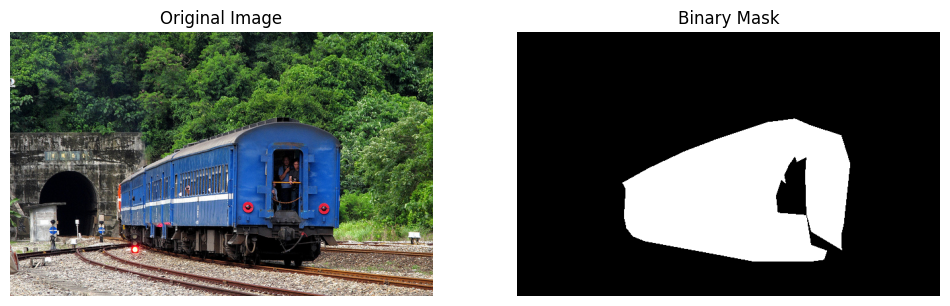


✅ Saved and visualized 10 masks in: /content/drive/MyDrive/VisionExtract/data/coco2017/train_masks


In [36]:
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

# ------------------ Paths ------------------
dataDir = '/content/drive/MyDrive/VisionExtract/data/coco2017'
imgDir = os.path.join(dataDir, 'val2017')
annFile = '/content/drive/MyDrive/VisionExtract/data/annotations/instances_val2017.json'

output_mask_dir = os.path.join(dataDir, 'train_masks')
os.makedirs(output_mask_dir, exist_ok=True)

# ------------------ Initialize COCO ------------------
coco = COCO(annFile)

# ------------------ Category ------------------
catId = 7  # Train category
imgIds = coco.getImgIds(catIds=[catId])
print(f"Total 'train' images in annotations: {len(imgIds)}")

# ------------------ Loop through only first 10 images ------------------
num_samples = 10
print(f"Showing {num_samples} sample images with masks...\n")

for count, imgId in enumerate(imgIds[:num_samples]):   # <--- simpler slicing
    img_info = coco.loadImgs(imgId)[0]
    img_path = os.path.join(imgDir, img_info['file_name'])

    if not os.path.exists(img_path):
        print(f"Skipping missing image: {img_info['file_name']}")
        continue

    # Read original image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width = img_info['height'], img_info['width']

    # Create empty mask
    mask = np.zeros((height, width), dtype=np.uint8)

    # Get annotations for this image
    annIds = coco.getAnnIds(imgIds=imgId, catIds=[catId], iscrowd=None)
    anns = coco.loadAnns(annIds)

    for ann in anns:
        rle = coco.annToRLE(ann)
        m = maskUtils.decode(rle)
        mask = np.maximum(mask, m)

    # Save binary mask
    mask_filename = os.path.join(output_mask_dir, f"{img_info['file_name'].split('.')[0]}_mask.png")
    cv2.imwrite(mask_filename, mask*255)

    # ---- Plot side by side ----
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title("Binary Mask")
    axes[1].axis("off")

    plt.show()

print(f"\n✅ Saved and visualized {num_samples} masks in: {output_mask_dir}")
